# Data Visualization for 900 cargo drivers

This notebook visualizes stop and moving points identified from the data of 900+ cargo drivers. 
The focus of this notebook is in:
* **geospatial patterns**
* **moving speeds**
* **time-of-day**


### Table of Contents
* [1 Introduction](#Introduction)
    * 1.1 Criteria for Stop Points 


* [2 Geospatial Visualizations](#Geo)
    * 2.1 Where are the Stop and Moving points?
    * 2.2 Moving Speeds
    * 2.3 Time of Day (Stops)
    * 2.4 Time of Day (Moving)


* [3 Other Visualizations](#Other)
    * 3.1 What times of day do drivers stop?
    * 3.2 What times do drivers stop for longer than 7 hours?
    * 3.3 What times of day do drivers move?
    * 3.4 How long do drivers stop for?
    * 3.5 At what speeds do drivers move? 


* [4 Summary](#Summary)


* [5 Appendix](#Appendix)
    * 5.1 Data Sources
    * 5.2 Additional Python Scripts

<a id='Introduction'></a>
## 1 Introduction
### 1.1 Criteria for Stop Points
I used the following criteria to classify stop points. The rest are moving points.
1. **Speed** < 10kmph
2. **Distance** from next point < 2km
3. **Not isolated** i.e. part of at least 2 consecutive stop points. 

After finding stop points, I further processed the data via the next two steps:
1. Collapse consecutive stop points into one stop point (kept only the first point of stopping). 
2. Remove incomplete trips of each user i.e. Remove last few rows so that the last data point of each user is a "stop point".

In [7]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings(action='ignore')

df = pd.read_csv('../data/data_with_sp.csv')
pd.set_option('max_colwidth',10)
city_df = pd.read_csv('../data/cargo_cities.csv')

#print("\nPreview data and city coordinates: ")
#print(df.head(3))
#print(city_df.head(3))

<a id='Geo'></a>
## 2 Geospatial Visualizations

<a id='2.1'></a>
## 2.1 Where are the Stop and Moving Points?
* Each driver tends to have long stop points in **at least two cities**. 
* This might mean that they have **more than one place of accommodation**. This is supported by the [plot below](#geo-tod-stop) which show that these stops begin at night. 
* The stop points at the end of each "branch" seem like loading/unload points.


* 长停点在多过一个城市出现。
* 司机们可能在不同城市睡晚觉。
* 许多路线的尽头都有个短暂的停留点。它们应该是装卸货点。

In [13]:
# Helper script
import visualize as vis
mpl.rcParams['figure.dpi'] = 1000

# List of available plots: ['stop_move_basic', 'move_allspeed', 'move_speed100', 'move_timeofDay', 'stop_timeofDay']
vis.show_plot('stop_move_basic',df,city_df)

<a id='geo-move-speed'></a>
## 2.2 Moving Speeds
* User C has several short stops between Luzhou and Zunyi. These "stop points" might be **due to heavy traffic**. This matches the low speeds shown in that route. 


* User C 泸州和遵义的那一段路程有许多短暂的停留点。它们有可能是因为交通阻塞。

In [21]:
vis.show_plot('move_allspeed',df,city_df)

<a id='geo-tod-stop'></a>
## 2.3 Time of Day (Stops)
* Long stops in the city are usually occur betweeen 5pm-11pm. See [chart](#long-stop-times) below.
* Delivery points can be seen from short stops near the end of each "branch". These stops at the end of these "branches" tend to be **orange/yellow**, which suggest that many deliveries **occur between 10am-12pm**. 


* 多数的长停留站在17:00－23:00之间开始。
* 路线尽头的短暂停留点大多数是橙黄色。这代表司机可能偏于在10:00-12:00搬货物。

In [23]:
vis.show_plot('stop_timeofDay',df,city_df)

<a id='2.4'></a>
## 2.4 Time of Day (Moving)
* Several intercity routes have both a morning (orange) and evening (blue) component. 
* The [bar chart](#move-time-chart) below show that most trips occur between **10am-8pm**.


* 许多 Intercity 路途有上午和下午的现象。
* 看以下的 [bar chart](#move-time-chart)

In [24]:
vis.show_plot('move_timeofDay',df,city_df)

<a id='Other'></a>
## 3 Other Visualizations

In [54]:
plt.style.use('ggplot')
import seaborn as sns

def std_plot(data,xlabel,ylabel='Number of Points',legend=False,plotstyle='bar',hist_max=20,bins=100,figscale=1):
    fig = plt.figure(figsize=(7*figscale,3*figscale))
    ax = plt.axes()
    if plotstyle=='bar':
        data.plot.bar(ax=ax,legend=legend)
    elif plotstyle=='hist':
        plt.hist(data,bins=bins,range=(data.min(),hist_max))
    ax.set_xlabel(xlabel,fontsize='small',fontweight='bold')
    if ylabel is not None: ax.set_ylabel(ylabel,fontsize='small',fontweight='bold')
    ax.xaxis.set_tick_params(labelsize='small')
    ax.yaxis.set_tick_params(labelsize='small')
    plt.tight_layout()
    plt.show()

<a id='stop-times'></a>
## 3.1 What times of day do drivers stop? 

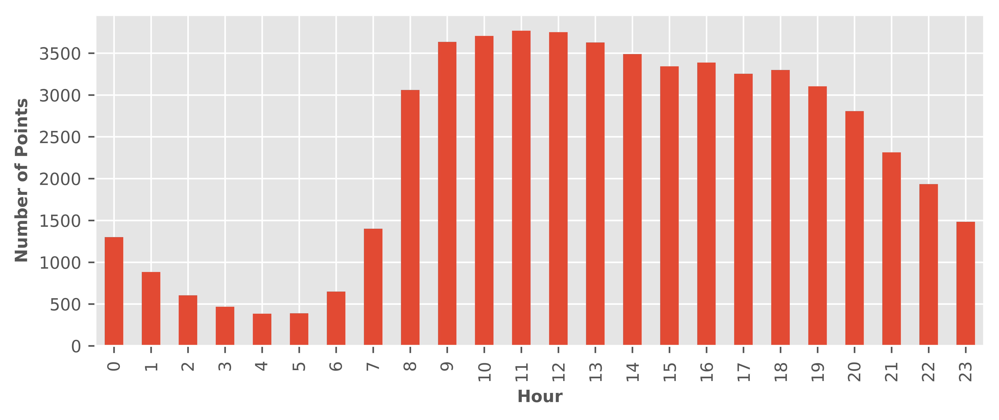

In [28]:
df['hour'] = pd.to_datetime(df['datetime']).dt.hour
totals = df[df.stop_pt.notnull()].hour.value_counts(sort=False).to_frame('total count')
percentages = df[df.stop_pt.notnull()].hour.value_counts(sort=False,normalize=True).to_frame('relative').round(3)
#print(pd.concat([totals,percentages],axis=1))
std_plot(totals,'Hour')

<a id='long-stop-times'></a>
## 3.2 What times do drivers stop for longer than 7 hours? 
Note: This plot shows the **first** hour of stopping.

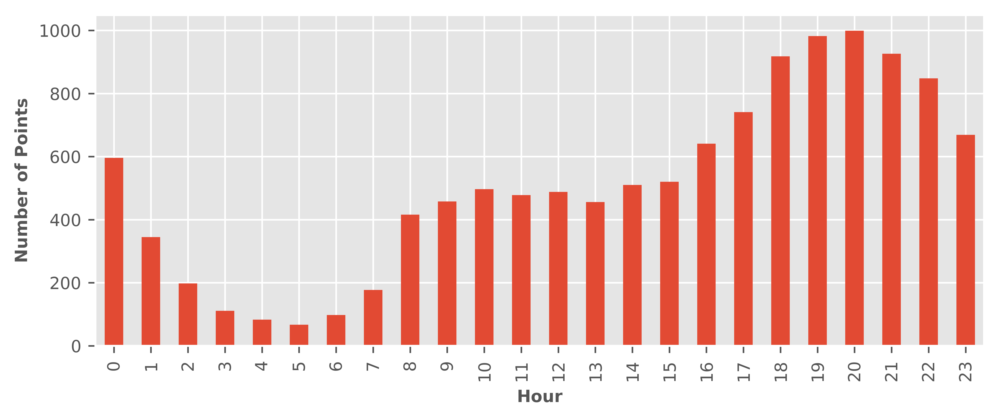

In [36]:
max_dur = 7
totals = df[df['stop_duration']>max_dur].hour.value_counts(sort=False).to_frame('total count')
totals = totals.sort_index(ascending=True)
percentages = df[df.stop_duration>max_dur].hour.value_counts(sort=False,normalize=True).to_frame('relative')
std_plot(totals,'Hour')

<a id='move-time-chart'></a>
## 3.3 What times of day do drivers move? 

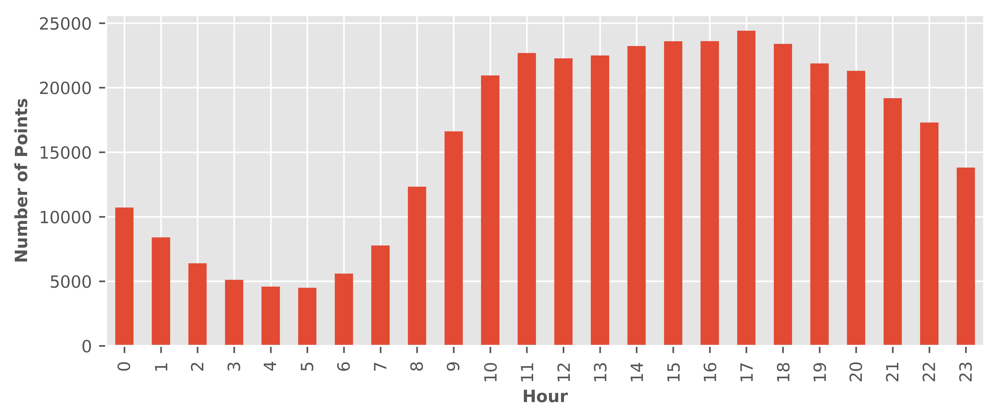

In [37]:
totals = df[df.stop_pt.isnull()].hour.value_counts(sort=False).to_frame('total count')
percentages = df[df.stop_pt.isnull()].hour.value_counts(normalize=True).to_frame('relative').round(3)
std_plot(totals,'Hour')

<a id='stop-duration'></a>
## 3.4 How long do drivers stop for? 

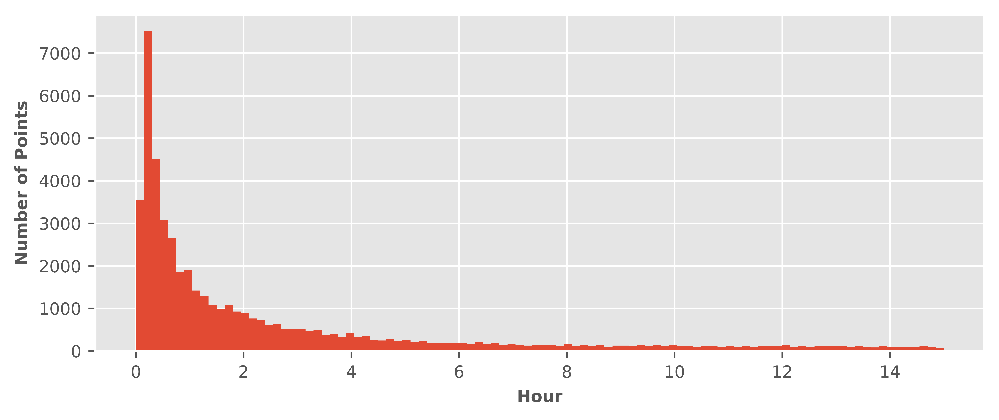

In [38]:
duration = df[df.stop_pt.notnull()].stop_duration
std_plot(duration,'Hour',plotstyle='hist',hist_max=15)

<a id='moving-speed-chart'></a>
## 3.5 At what speeds do drivers move?
Note: This does *not* include stop points. 

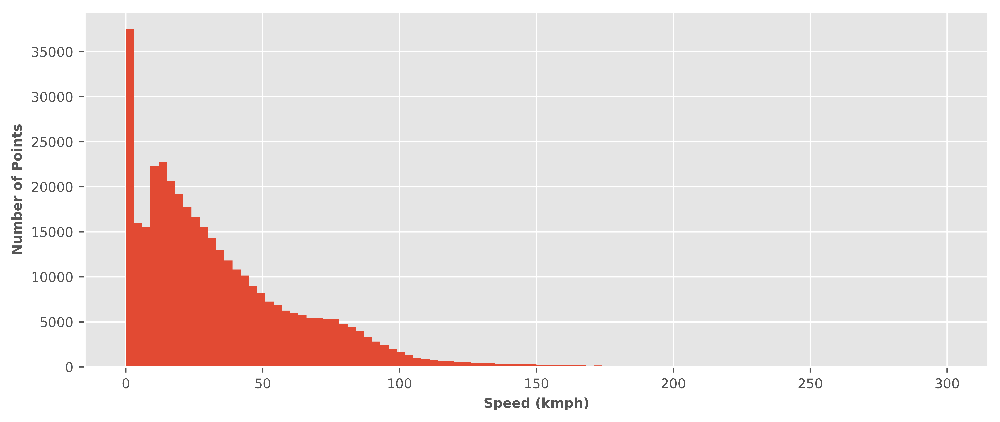

In [55]:
speed = df[df.stop_pt.isnull()].avgspeed
std_plot(speed,'Speed (kmph)',plotstyle='hist',hist_max=300,bins=100,figscale=1.25)

<a id='Summary'></a>
## 4. Summary

### Key Insights:
1. Drivers seem to have **more than one** place of accomodation. 
2. Delivery trips could be identified by "branches" of roads which end with a short stop point. 
3. The stops at these branches tend to occur around **10am-12pm**. Drivers may prefer deliveries in the late morning.


1. 司机们停留睡觉的地方不限制于一个城市。
2. 用Geospatial Visualization可以看路线分支。分支尽头都有个短停留站。这些应该是装卸货点。
3. 这些停留站发生在在10AM至12PM左右。 

<a id='Appendix'></a>
# 5 Appendix

### 5.1 Data Sources
* *dr900_passive.csv*: The original data for 900+ cargo drivers.
* *data_with_sp.csv*: This is the processed data with stop (and moving) points identified. We will be visualizing data from this file. 
* *cargo_cities.csv*: This file contains city coordinates from Google Drive. These cities will be shown in the maps below. 

### 5.2 Additional Python Scripts
* *get_stoppoints.py*: This script was used to identify the stop points.
* *visualize.py*: This script was written to help visualize the data below. 

## -- End of notebook. --

In [56]:
# To hide/show Code
from IPython.display import HTML
toggl = '''<script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.input').hide();
} else {
$('div.input').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Show/Hide Python Code"></form>'''
HTML(toggl)

In [40]:
# Show/Hide Warnings
from IPython.display import HTML
def show_hide_warnings():
    return '''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
<a href="javascript:code_toggle_err()">Show/Hide Warnings</a>'''

#HTML(show_hide_warnings())

In [60]:
# Styling for Notebook
from IPython.core.display import HTML,Javascript
def css():
    style = open("css/custom.css", "r").read()
    return HTML(style)
css()